In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.express as px
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [2]:
data= pd.read_csv(r"C:\Users\shash\Downloads\Final_Project\Earthquake_Data\usgs_main.csv")

In [3]:
data.head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2022-03-04T21:28:02.440Z,38.759666,-122.719666,1.61,1.24,md,14.0,115.0,0.004494,0.04,...,2022-03-04T21:29:36.906Z,"3km SW of Anderson Springs, CA",earthquake,0.30,0.36,0.100,5.0,automatic,nc,nc
1,2022-03-04T21:27:28.190Z,38.833832,-122.815498,1.82,1.13,md,22.0,66.0,0.016320,0.02,...,2022-03-04T21:29:02.128Z,"8km NW of The Geysers, CA",earthquake,0.19,0.53,0.140,4.0,automatic,nc,nc
2,2022-03-04T21:25:05.130Z,35.596668,-120.271332,11.57,2.31,md,5.0,178.0,0.159000,0.01,...,2022-03-04T21:26:56.893Z,"11km SE of Shandon, CA",earthquake,3.14,3.51,0.760,3.0,automatic,nc,nc
3,2022-03-04T21:20:43.590Z,35.929167,-117.660833,3.25,0.88,ml,9.0,73.0,0.020530,0.13,...,2022-03-04T21:24:10.449Z,"22km E of Little Lake, CA",earthquake,0.33,0.74,0.055,10.0,automatic,ci,ci
4,2022-03-04T21:19:08.215Z,62.360200,-149.634500,9.80,1.40,ml,NaN,NaN,NaN,0.52,...,2022-03-04T21:22:15.794Z,"24 km NNE of Susitna North, Alaska",earthquake,NaN,0.50,NaN,NaN,automatic,ak,ak


In [4]:
print("Total number of Rows and Columns in Data Source\n",data.shape)

Total number of Rows and Columns in Data Source
 (28256, 22)


In [5]:
for col in enumerate (data.columns):
    print("Columns",col)

Columns (0, 'time')
Columns (1, 'latitude')
Columns (2, 'longitude')
Columns (3, 'depth')
Columns (4, 'mag')
Columns (5, 'magType')
Columns (6, 'nst')
Columns (7, 'gap')
Columns (8, 'dmin')
Columns (9, 'rms')
Columns (10, 'net')
Columns (11, 'id')
Columns (12, 'updated')
Columns (13, 'place')
Columns (14, 'type')
Columns (15, 'horizontalError')
Columns (16, 'depthError')
Columns (17, 'magError')
Columns (18, 'magNst')
Columns (19, 'status')
Columns (20, 'locationSource')
Columns (21, 'magSource')


In [6]:
data.isnull().sum()

time                8402
latitude            8402
longitude           8402
depth               8402
mag                 8404
magType             8404
nst                13796
gap                11850
dmin               15125
rms                 8407
net                 8402
id                  8402
updated             8402
place               8402
type                8402
horizontalError    13245
depthError          8417
magError           13198
magNst             11854
status              8402
locationSource      8402
magSource           8402
dtype: int64

In [7]:
columns_to_drop = ['net', 'id', 'updated', 'nst', 'magNst', 'locationSource', 'magSource']
data.drop(columns=columns_to_drop, inplace=True)

In [8]:
mean_mag= data['mag'].mean()
data['mag'].fillna(mean_mag, inplace= True)

In [9]:
mode_magType= data['magType'].mode()[0]
data['magType'].fillna(mode_magType, inplace= True)

In [10]:
mean_gap= data['gap'].mean()
data['gap'].fillna(mean_gap, inplace= True)

In [11]:
mean_dmin= data['dmin'].mean()
data['dmin'].fillna(mean_dmin, inplace= True)

In [12]:
mean_rms= data['rms'].mean()
data['rms'].fillna(mean_rms, inplace= True)

In [13]:
mean_horizontalError= data['horizontalError'].mean()
data['horizontalError'].fillna(mean_horizontalError, inplace= True)

In [14]:
mean_depthError= data['depthError'].mean()
data['depthError'].fillna(mean_depthError, inplace= True)

In [15]:
mean_magError= data['magError'].mean()
data['magError'].fillna(mean_magError, inplace= True)

In [16]:
data.isnull().sum()

time               8402
latitude           8402
longitude          8402
depth              8402
mag                   0
magType               0
gap                   0
dmin                  0
rms                   0
place              8402
type               8402
horizontalError       0
depthError            0
magError              0
status             8402
dtype: int64

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28256 entries, 0 to 28255
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             19854 non-null  object 
 1   latitude         19854 non-null  float64
 2   longitude        19854 non-null  float64
 3   depth            19854 non-null  float64
 4   mag              28256 non-null  float64
 5   magType          28256 non-null  object 
 6   gap              28256 non-null  float64
 7   dmin             28256 non-null  float64
 8   rms              28256 non-null  float64
 9   place            19854 non-null  object 
 10  type             19854 non-null  object 
 11  horizontalError  28256 non-null  float64
 12  depthError       28256 non-null  float64
 13  magError         28256 non-null  float64
 14  status           19854 non-null  object 
dtypes: float64(10), object(5)
memory usage: 3.2+ MB


<AxesSubplot: >

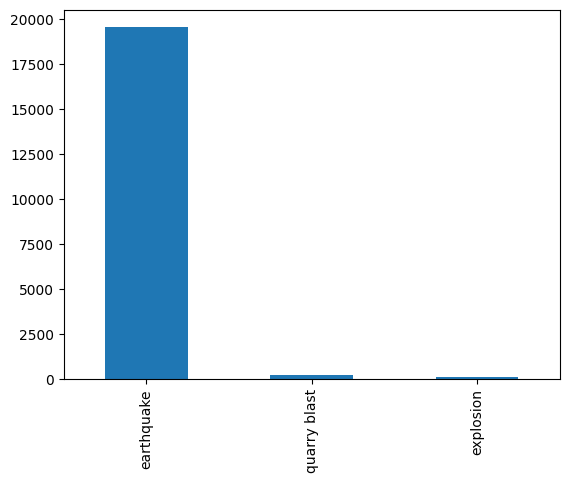

In [18]:
data['type'].value_counts().plot(kind='bar')

<AxesSubplot: >

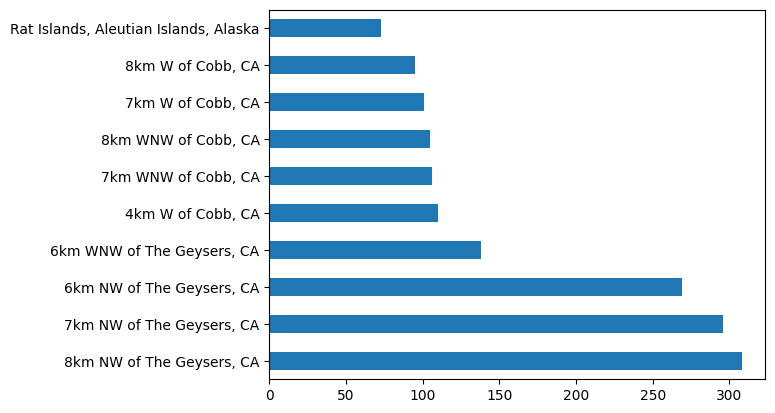

In [19]:
place_count=data['place'].value_counts()
place_count.head(10).plot(kind='barh')

C:\Users\shash\AppData\Roaming\Python\Python311\site-packages\matplotlib\collections.py:967: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


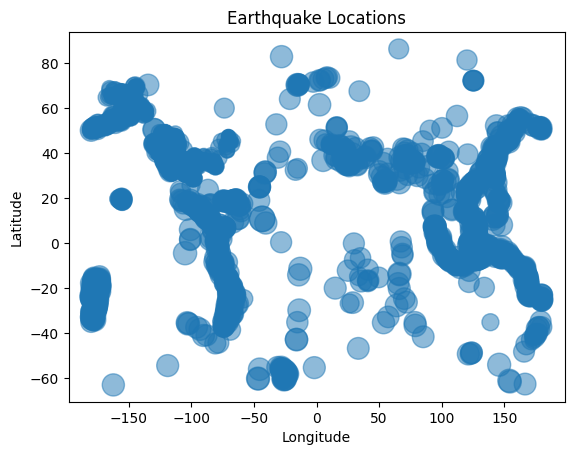

In [20]:
latitude = data['latitude']
longitude = data['longitude']
magnitude = data['mag']

plt.scatter(longitude, latitude, s=magnitude*50, alpha=0.5)

plt.title('Earthquake Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show()

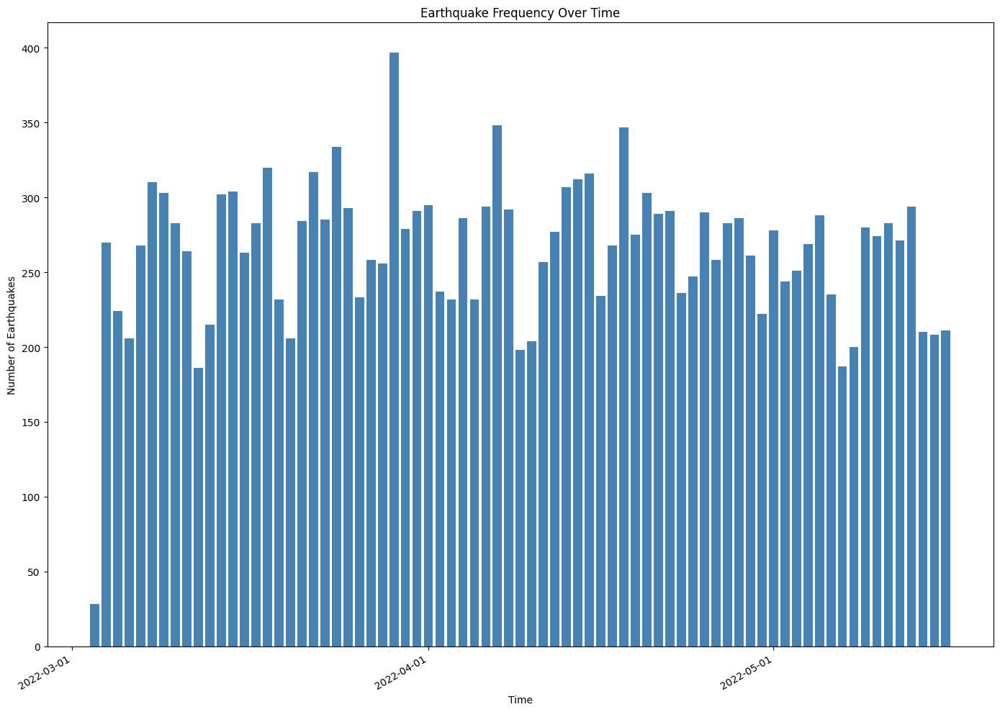

In [21]:
data['time'] = pd.to_datetime(data['time'])

daily_counts = data.resample('D', on='time').size()

plt.figure(figsize=(14, 10))
plt.bar(daily_counts.index, daily_counts.values, color='steelblue', width=0.8)

plt.title('Earthquake Frequency Over Time')
plt.xlabel('Time')
plt.ylabel('Number of Earthquakes')

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())  
plt.gcf().autofmt_xdate() 
plt.tight_layout()  
plt.show()


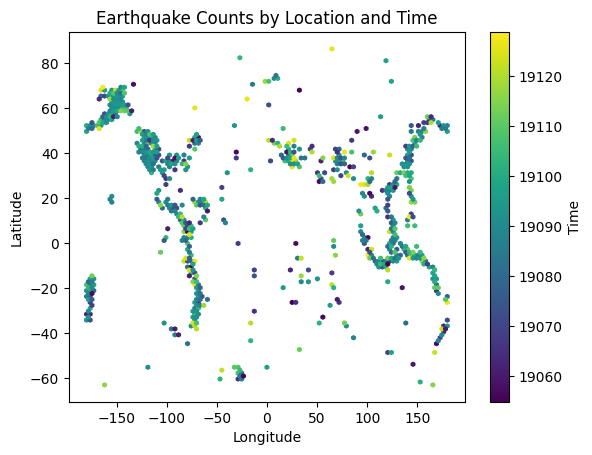

In [22]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Drop rows where 'time' is NaT (missing)
data_cleaned = data.dropna(subset=['time'])

# Extract latitude, longitude, and time
latitude = data_cleaned['latitude']
longitude = data_cleaned['longitude']
time = data_cleaned['time']

# Convert time to numerical values using date2num
time_num = mdates.date2num(time)

# Plot hexbin with time as color mapping
plt.hexbin(longitude, latitude, C=time_num, cmap='viridis')

# Add a color bar
plt.colorbar(label='Time')

# Set plot title and axis labels
plt.title('Earthquake Counts by Location and Time')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()


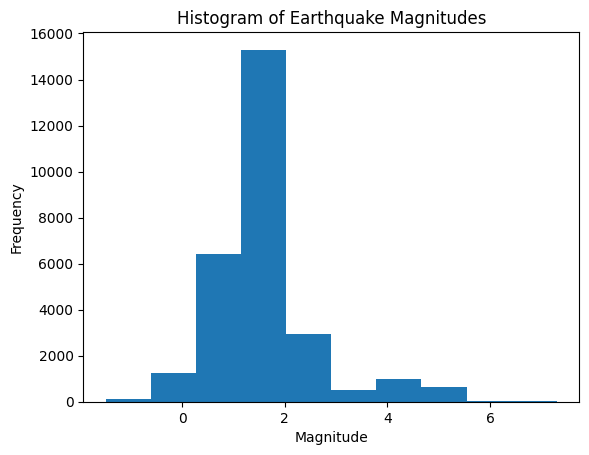

In [23]:
plt.hist(data['mag'], bins=10)
plt.title('Histogram of Earthquake Magnitudes')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.show()

In [24]:
latest_time = data.iloc[-1]['time']
latest_lat = data.iloc[-1]['latitude']
latest_lon = data.iloc[-1]['longitude']
latest_mag = data.iloc[-1]['mag']

latest_df = pd.DataFrame({'time': [latest_time], 'latitude': [latest_lat], 'longitude': [latest_lon], 'magnitude': [latest_mag]})


fig = px.scatter(latest_df, x='longitude', y='latitude', size='magnitude', hover_data=['time'], title=f'Latest Earthquake: {latest_time}')
fig.show()

In [25]:
import folium

# Drop rows with missing latitude or longitude values
data_cleaned = data.dropna(subset=['latitude', 'longitude'])

# Calculate the mean latitude and longitude for map centering
mean_lat = data_cleaned['latitude'].mean()
mean_lon = data_cleaned['longitude'].mean()

# Create a map centered on the average latitude and longitude of the earthquakes
map = folium.Map(location=[mean_lat, mean_lon], zoom_start=3)

# Add a marker for each earthquake
for i, row in data_cleaned.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']], 
                        radius=row['mag']*3, 
                        color='red', 
                        fill=True).add_to(map)

# Display the map
map

In [26]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

data['time'] = pd.to_datetime(data['time'], errors='coerce')  # Coerce errors to NaT

data = data.dropna(subset=['time'])

data['time'] = data['time'].apply(lambda x: x.timestamp())

categorical_cols = ['magType', 'place', 'type', 'status']
data_encoded = pd.get_dummies(data, columns=categorical_cols, drop_first=True)  # drop_first to avoid multicollinearity

# Step 3: Scaling numerical features
scaler = MinMaxScaler()
numerical_cols = ['time', 'latitude', 'longitude', 'depth', 'mag', 'gap', 'dmin', 'rms', 'horizontalError', 'depthError', 'magError']
data_encoded[numerical_cols] = scaler.fit_transform(data_encoded[numerical_cols])

# The 'data_encoded' DataFrame is now ready for modeling

In [27]:
# Assuming X and y are prepared for regression
X = data_encoded.drop(columns=['mag'])  
y = data_encoded['mag'].values  # y should be continuous (regression)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling
scaler = MinMaxScaler(feature_range=(0, 1))
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled = X_train_scaled.reshape(X_train_scaled.shape[0], 1, X_train_scaled.shape[1])
X_test_scaled = X_test_scaled.reshape(X_test_scaled.shape[0], 1, X_test_scaled.shape[1])

model = tf.keras.models.Sequential()
model.add(tf.keras.layers.LSTM(50, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2])))
model.add(tf.keras.layers.Dense(1))  

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])  

history = model.fit(X_train_scaled, y_train, epochs=20, batch_size=64, validation_data=(X_test_scaled, y_test), verbose=1)



Epoch 1/20


249/249 [==============================] - 15s 39ms/step - loss: 0.0144 - mae: 0.0832 - val_loss: 0.0056 - val_mae: 0.0560
Epoch 2/20
249/249 [==============================] - ETA: 0s - loss: 0.0036 - mae: 0.0433

KeyboardInterrupt: 

In [28]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 50)                2032200   
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 2032251 (7.75 MB)
Trainable params: 2032251 (7.75 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [29]:
print(model.input_shape)

(None, 1, 10110)


In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs (MSE)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [43]:
model.save('earthquake_magnitude_model.h5')

C:\Users\shash\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [44]:
from tensorflow.keras.models import load_model

In [45]:
model= load_model('earthquake_magnitude_model.h5')

In [46]:
model

In [31]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, LSTM, Input, Attention, RepeatVector, Concatenate
from tensorflow.keras.models import Model


# Assuming X and y are prepared for regression
X = data_encoded.drop(columns=['mag'])  
y = data_encoded['mag'].values  # y should be continuous (regression)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling
scaler = MinMaxScaler(feature_range=(0, 1))
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled = X_train_scaled.reshape(X_train_scaled.shape[0], 1, X_train_scaled.shape[1])
X_test_scaled = X_test_scaled.reshape(X_test_scaled.shape[0], 1, X_test_scaled.shape[1])


def build_lstm_attention_model(input_shape):
    inputs = Input(shape=input_shape)
    
    lstm_out, state_h, state_c = LSTM(50, return_sequences=True, return_state=True)(inputs)
    
    attention = Dense(1, activation='tanh')(lstm_out)   
    attention = tf.nn.softmax(attention, axis=1)       
    context_vector = tf.reduce_sum(attention * lstm_out, axis=1) 
    
    output = Dense(1)(context_vector)  
    
    model = Model(inputs=inputs, outputs=output)
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    
    return model

input_shape = (X_train_scaled.shape[1], X_train_scaled.shape[2])
lstm_attention_model = build_lstm_attention_model(input_shape)

history_lstm_attention = lstm_attention_model.fit(
    X_train_scaled, y_train,
    epochs=20,
    batch_size=64,
    validation_data=(X_test_scaled, y_test),
    verbose=1
)



Epoch 1/20


249/249 [==============================] - 11s 35ms/step - loss: 0.0143 - mae: 0.0822 - val_loss: 0.0055 - val_mae: 0.0559
Epoch 2/20
249/249 [==============================] - 7s 30ms/step - loss: 0.0035 - mae: 0.0428 - val_loss: 0.0049 - val_mae: 0.0518
Epoch 3/20
249/249 [==============================] - 8s 31ms/step - loss: 0.0022 - mae: 0.0329 - val_loss: 0.0049 - val_mae: 0.0513
Epoch 4/20
249/249 [==============================] - 8s 31ms/step - loss: 0.0019 - mae: 0.0298 - val_loss: 0.0048 - val_mae: 0.0513
Epoch 5/20
249/249 [==============================] - 7s 30ms/step - loss: 0.0017 - mae: 0.0286 - val_loss: 0.0048 - val_mae: 0.0509
Epoch 6/20
249/249 [==============================] - 7s 30ms/step - loss: 0.0016 - mae: 0.0281 - val_loss: 0.0047 - val_mae: 0.0510
Epoch 7/20
249/249 [==============================] - 8s 31ms/step - loss: 0.0015 - mae: 0.0274 - val_loss: 0.0048 - val_mae: 0.0512
Epoch 8/20
249/249 [==============================] - 8s 32ms/st

In [1]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense

# Split data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the data
scaler = MinMaxScaler(feature_range=(0, 1))
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reshape data for LSTM/GRU
X_train_scaled = X_train_scaled.reshape(X_train_scaled.shape[0], 1, X_train_scaled.shape[1])
X_test_scaled = X_test_scaled.reshape(X_test_scaled.shape[0], 1, X_test_scaled.shape[1])

# Build LSTM with GRU Model
model_lstm_gru = Sequential()
model_lstm_gru.add(LSTM(50, return_sequences=True, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2])))
model_lstm_gru.add(GRU(50))  # GRU layer
model_lstm_gru.add(Dense(1))  # Output layer for regression
model_lstm_gru.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

# Train the model
history_lstm_gru = model_lstm_gru.fit(
    X_train_scaled, y_train,
    validation_data=(X_test_scaled, y_test),
    epochs=20,
    batch_size=64,
    verbose=1
)


NameError: name 'X' is not defined